# Getting Started

ศึกษามาจาก :  https://thepythoncode.com/article/image-captioning-with-pytorch-and-transformers-in-python

In [65]:
import locale
locale.getpreferredencoding = lambda do_setlocale=True: "UTF-8"

In [66]:
pip install transformers[torch]

In [67]:
pip install accelerate -U

In [68]:
!pip install transformers rouge_score evaluate datasets accelerate

In [69]:
pip install sentencepiece

In [70]:
pip show accelerate

Name: accelerate
Version: 0.25.0
Summary: Accelerate
Home-page: https://github.com/huggingface/accelerate
Author: The HuggingFace team
Author-email: sylvain@huggingface.co
License: Apache
Location: /usr/local/lib/python3.10/dist-packages
Requires: huggingface-hub, numpy, packaging, psutil, pyyaml, safetensors, torch
Required-by: 


In [71]:
import requests
import torch
from PIL import Image
from transformers import *
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"

# Using a Trained Model

In [72]:
# load a fine-tuned image captioning model and corresponding tokenizer and image processor
finetuned_model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning").to(device)
finetuned_tokenizer = GPT2TokenizerFast.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
finetuned_image_processor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--nlpconnect--vit-gpt2-image-captioning/snapshots/dc68f91c06a1ba6f15268e5b9c13ae7a7c514084/config.json
Model config VisionEncoderDecoderConfig {
  "_name_or_path": "vit-gpt-pt",
  "architectures": [
    "VisionEncoderDecoderModel"
  ],
  "bos_token_id": 50256,
  "decoder": {
    "_name_or_path": "",
    "activation_function": "gelu_new",
    "add_cross_attention": true,
    "architectures": [
      "GPT2LMHeadModel"
    ],
    "attn_pdrop": 0.1,
    "bad_words_ids": null,
    "begin_suppress_tokens": null,
    "bos_token_id": 50256,
    "chunk_size_feed_forward": 0,
    "cross_attention_hidden_size": null,
    "decoder_start_token_id": 50256,
    "diversity_penalty": 0.0,
    "do_sample": false,
    "early_stopping": false,
    "embd_pdrop": 0.1,
    "encoder_no_repeat_ngram_size": 0,
    "eos_token_id": 50256,
    "exponential_decay_length_penalty": null,
    "finetuning_task": null,
    "forced_bo

In [73]:
import urllib.parse as parse
import os

# a function to determine whether a string is a URL or not
def is_url(string):
    try:
        result = parse.urlparse(string)
        return all([result.scheme, result.netloc, result.path])
    except:
        return False

# a function to load an image
def load_image(image_path):
    if is_url(image_path):
        return Image.open(requests.get(image_path, stream=True).raw)
    elif os.path.exists(image_path):
        return Image.open(image_path)


# a function to perform inference
def get_caption(model, image_processor, tokenizer, image_path):
    image = load_image(image_path)
    # preprocess the image
    img = image_processor(image, return_tensors="pt").to(device)
    # generate the caption (using greedy decoding by default)
    output = model.generate(**img)
    # decode the output
    caption = tokenizer.batch_decode(output, skip_special_tokens=True)[0]
    return caption

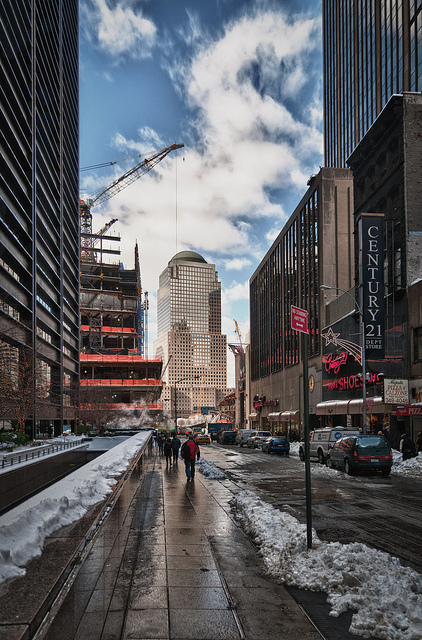

Generate config GenerationConfig {
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256
}



'a person walking down a street with a snow covered sidewalk '

In [74]:
# load displayer
from IPython.display import display

url = "http://images.cocodataset.org/test-stuff2017/000000009384.jpg"
display(load_image(url))
get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, url)

# Fine-tuning your Own Image Captioning Model

## Loading the Model

In [75]:
# the encoder model that process the image and return the image features
encoder_model = "WinKawaks/vit-small-patch16-224"
# encoder_model = "google/vit-base-patch16-224"
# encoder_model = "google/vit-base-patch16-224-in21k"
# encoder_model = "microsoft/swin-base-patch4-window7-224-in22k"
# the decoder model that process the image features and generate the caption text
# decoder_model = "bert-base-uncased"
decoder_model = "prajjwal1/bert-tiny"
# decoder_model = "gpt2"
# load the model
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(
    encoder_model, decoder_model
).to(device)

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--WinKawaks--vit-small-patch16-224/snapshots/592871fe95484877e8a4b4acc8f16755ec29a770/config.json
Model config ViTConfig {
  "_name_or_path": "WinKawaks/vit-small-patch16-224",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 384,
  "id2label": {
    "0": "tench, Tinca tinca",
    "1": "goldfish, Carassius auratus",
    "2": "great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias",
    "3": "tiger shark, Galeocerdo cuvieri",
    "4": "hammerhead, hammerhead shark",
    "5": "electric ray, crampfish, numbfish, torpedo",
    "6": "stingray",
    "7": "cock",
    "8": "hen",
    "9": "ostrich, Struthio camelus",
    "10": "brambling, Fringilla montifringilla",
    "11": "goldfinch, Carduelis carduelis",
    "12": "house finch, linnet

In [76]:
# initialize the tokenizer
tokenizer = AutoTokenizer.from_pretrained(decoder_model)
# tokenizer = GPT2TokenizerFast.from_pretrained(decoder_model)
# tokenizer = BertTokenizerFast.from_pretrained(decoder_model)
# load the image processor
image_processor = ViTImageProcessor.from_pretrained(encoder_model)

Could not locate the tokenizer configuration file, will try to use the model config instead.
loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--prajjwal1--bert-tiny/snapshots/6f75de8b60a9f8a2fdf7b69cbd86d9e64bcb3837/config.json
Model config BertConfig {
  "_name_or_path": "prajjwal1/bert-tiny",
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 128,
  "initializer_range": 0.02,
  "intermediate_size": 512,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 2,
  "num_hidden_layers": 2,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.35.2",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at /root/.cache/huggingface/hub/models--prajjwal1--bert-tiny/snapshots/6f75de8b60a9f8a2fdf7b69cbd86d9e64bcb3837/vocab.txt


In [77]:
if "gpt2" in decoder_model:
  # gpt2 does not have decoder_start_token_id and pad_token_id
  # but has bos_token_id and eos_token_id
  tokenizer.pad_token = tokenizer.eos_token # pad_token_id as eos_token_id
  model.config.eos_token_id = tokenizer.eos_token_id
  model.config.pad_token_id = tokenizer.pad_token_id
  # set decoder_start_token_id as bos_token_id
  model.config.decoder_start_token_id = tokenizer.bos_token_id
else:
  # set the decoder start token id to the CLS token id of the tokenizer
  model.config.decoder_start_token_id = tokenizer.cls_token_id
  # set the pad token id to the pad token id of the tokenizer
  model.config.pad_token_id = tokenizer.pad_token_id

## Downloading & Loading the Dataset

In [78]:
%pip install datasets

In [79]:
from datasets import load_dataset

max_length = 32 # max length of the captions in tokens
coco_dataset_ratio = 70 # 30% of the COCO2014 dataset
train_ds = load_dataset("HuggingFaceM4/COCO", split=f"train[:{coco_dataset_ratio}%]")
valid_ds = load_dataset("HuggingFaceM4/COCO", split=f"validation[:{coco_dataset_ratio}%]")
test_ds = load_dataset("HuggingFaceM4/COCO", split="test")
len(train_ds), len(valid_ds), len(test_ds)

(396723, 17507, 25010)

## Preprocessing the Inputs

In [80]:
import numpy as np

# remove the images with less than 3 dimensions (possibly grayscale images)
train_ds = train_ds.filter(lambda item: np.array(item["image"]).ndim in [3, 4], num_proc=2)
valid_ds = valid_ds.filter(lambda item: np.array(item["image"]).ndim in [3, 4], num_proc=2)
test_ds = test_ds.filter(lambda item: np.array(item["image"]).ndim in [3, 4], num_proc=2)

In [81]:
def preprocess(items):
  # preprocess the image
  pixel_values = image_processor(items["image"], return_tensors="pt").pixel_values.to(device)
  # tokenize the caption with truncation and padding
  targets = tokenizer([ sentence["raw"] for sentence in items["sentences"] ],
                      max_length=max_length, padding="max_length", truncation=True, return_tensors="pt").to(device)
  return {'pixel_values': pixel_values, 'labels': targets["input_ids"]}


# using with_transform to preprocess the dataset during training
train_dataset = train_ds.with_transform(preprocess)
valid_dataset = valid_ds.with_transform(preprocess)
test_dataset  = test_ds.with_transform(preprocess)

In [82]:
# a function we'll use to collate the batches
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.stack([x['labels'] for x in batch])
    }

## Evaluation Metrics

In [83]:
import evaluate

# load the rouge and bleu metrics
rouge = evaluate.load("rouge")
bleu = evaluate.load("bleu")

def compute_metrics(eval_pred):
  preds = eval_pred.label_ids
  labels = eval_pred.predictions
  # decode the predictions and labels
  pred_str = tokenizer.batch_decode(preds, skip_special_tokens=True)
  labels_str = tokenizer.batch_decode(labels, skip_special_tokens=True)
  # compute the rouge score
  rouge_result = rouge.compute(predictions=pred_str, references=labels_str)
  # multiply by 100 to get the same scale as the rouge score
  rouge_result = {k: round(v * 100, 4) for k, v in rouge_result.items()}
  # compute the bleu score
  bleu_result = bleu.compute(predictions=pred_str, references=labels_str)
  # get the length of the generated captions
  generation_length = bleu_result["translation_length"]
  return {
        **rouge_result,
        "bleu": round(bleu_result["bleu"] * 100, 4),
        "gen_len": bleu_result["translation_length"] / len(preds)
  }

## Training

In [84]:
num_epochs = 2 # number of epochs
batch_size = 32 # the size of batches

In [85]:
for item in train_dataset:
  print(item["labels"].shape)
  print(item["pixel_values"].shape)
  break

torch.Size([32])
torch.Size([3, 224, 224])


### Using the Trainer Class

In [86]:
# define the training arguments
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,             # use generate to calculate the loss
    num_train_epochs=num_epochs,            # number of epochs
    evaluation_strategy="steps",            # evaluate after each eval_steps
    eval_steps=4000,                        # evaluate after each 2000 steps
    logging_steps=4000,                     # log after each 2000 steps
    save_steps=4000,                        # save after each 2000 steps
    per_device_train_batch_size=batch_size, # batch size for training
    per_device_eval_batch_size=batch_size,  # batch size for evaluation
    output_dir="vit-swin-base-224-gpt2-image-captioning", # output directory
    # push_to_hub=True # whether you want to push the model to the hub,
    # check this guide for more details: https://huggingface.co/transformers/model_sharing.html
)

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [87]:
# instantiate trainer
trainer = Seq2SeqTrainer(
    model=model,                     # the instantiated 🤗 Transformers model to be trained
    tokenizer=image_processor,       # we use the image processor as the tokenizer
    args=training_args,              # pass the training arguments
    compute_metrics=compute_metrics, # pass the compute metrics function
    train_dataset=train_dataset,     # pass the training dataset
    eval_dataset=valid_dataset,      # pass the validation dataset
    data_collator=collate_fn,        # pass the collate function
)

In [88]:
from torch.utils.data import DataLoader

def get_eval_loader(eval_dataset=None):
  return DataLoader(valid_dataset, collate_fn=collate_fn, batch_size=batch_size)

def get_test_loader(eval_dataset=None):
  return DataLoader(test_dataset, collate_fn=collate_fn, batch_size=batch_size)

# override the get_train_dataloader, get_eval_dataloader and
# get_test_dataloader methods of the trainer
# so that we can properly load the data
trainer.get_train_dataloader = lambda: DataLoader(train_dataset, collate_fn=collate_fn, batch_size=batch_size)
trainer.get_eval_dataloader = get_eval_loader
trainer.get_test_dataloader = get_test_loader

In [89]:
# train the model
trainer.train()

***** Running training *****
  Num examples = 395,888
  Num Epochs = 2
  Instantaneous batch size per device = 32
  Total train batch size (w. parallel, distributed & accumulation) = 32
  Gradient Accumulation steps = 1
  Total optimization steps = 24,744
  Number of trainable parameters = 26,412,090


Step,Training Loss,Validation Loss,Rouge1,Rouge2,Rougel,Rougelsum,Bleu,Gen Len
4000,1.509500,1.264467,24.253900,4.497400,23.103600,23.100200,2.152700,11.298878
8000,1.262300,1.182654,27.292800,6.346200,25.757500,25.751600,3.517800,11.298878
12000,1.189400,1.116481,31.798700,9.036500,29.729100,29.726300,5.045800,11.298878
16000,1.136300,1.072133,33.941500,10.571800,31.708900,31.696900,6.118200,11.298878
20000,1.107500,1.051224,35.139400,11.282400,32.832000,32.816700,6.617800,11.298878
24000,1.084300,1.041045,35.690600,11.771200,33.327300,33.315200,6.981200,11.298878


***** Running Evaluation *****
  Num examples = 17472
  Batch size = 32
Generate config GenerationConfig {
  "decoder_start_token_id": 101,
  "pad_token_id": 0
}

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1473: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(
Saving model checkpoint to vit-swin-base-224-gpt2-image-captioning/checkpoint-4000
Configuration saved in vit-swin-base-224-gpt2-image-captioning/checkpoint-4000/config.json
Configuration saved in vit-swin-base-224-gpt2-image-captioning/checkpoint-4000/generation_config.json
Model weights saved in vit-swin-base-224-gpt2-image-captioning/checkpoint-4000/pytorch_model.bin
Image processor

TrainOutput(global_step=24744, training_loss=1.2111373763233952, metrics={'train_runtime': 13212.966, 'train_samples_per_second': 59.924, 'train_steps_per_second': 1.873, 'total_flos': 1.6046624963203301e+19, 'train_loss': 1.2111373763233952, 'epoch': 2.0})

In [90]:
# evaluate on the test_dataset
trainer.evaluate(test_dataset)

***** Running Evaluation *****
  Num examples = 17472
  Batch size = 32
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1273: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


{'eval_loss': 1.0406486988067627,
 'eval_rouge1': 35.634,
 'eval_rouge2': 11.7795,
 'eval_rougeL': 33.28,
 'eval_rougeLsum': 33.2656,
 'eval_bleu': 6.9545,
 'eval_gen_len': 11.298878205128204,
 'eval_runtime': 279.9419,
 'eval_samples_per_second': 62.413,
 'eval_steps_per_second': 1.95,
 'epoch': 2.0}

In [91]:
# to free up GPU memory
import gc
# del predictions
# del outputs
# del labels
torch.cuda.empty_cache()
gc.collect()

12930

###Using PyTorch Training Loop

In [92]:
# alternative way of training: pytorch loop
from torch.utils.data import DataLoader

# define our data loaders
train_dataset_loader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=batch_size, shuffle=True)
valid_dataset_loader = DataLoader(valid_dataset, collate_fn=collate_fn, batch_size=8, shuffle=True)
test_dataset_loader = DataLoader(test_dataset, collate_fn=collate_fn, batch_size=8, shuffle=True)

In [93]:
from torch.optim import AdamW

# define the optimizer
optimizer = AdamW(model.parameters(), lr=1e-5)

In [94]:
# start tensorboard
%load_ext tensorboard
%tensorboard --logdir ./image-captioning/tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [96]:
# Training loop
from torch.utils.tensorboard import SummaryWriter

summary_writer = SummaryWriter(log_dir="./image-captioning/tensorboard")

# print some statistics before training
# number of training steps
n_train_steps = num_epochs * len(train_dataset_loader)
# number of validation steps
n_valid_steps = len(valid_dataset_loader)
# current training step
current_step = 0
# logging, eval & save steps
save_steps = 1000

In [97]:
for epoch in range(num_epochs):
    # set the model to training mode
    model.train()
    # initialize the training loss
    train_loss = 0
    for batch in tqdm(train_dataset_loader, "Training", total=len(train_dataset_loader), leave=False):
      if current_step % save_steps == 0:
        ### evaluation code ###
        # evaluate on the validation set
        # if the current step is a multiple of the save steps
        print()
        print(f"Validation at step {current_step}...")
        print()
        # set the model to evaluation mode
        model.eval()
        # initialize our lists that store the predictions and the labels
        predictions, labels = [], []
        # initialize the validation loss
        valid_loss = 0
        for batch in valid_dataset_loader:
            # get the batch
            pixel_values = batch["pixel_values"]
            label_ids = batch["labels"]
            # forward pass
            outputs = model(pixel_values=pixel_values, labels=label_ids)
            # get the loss
            loss = outputs.loss
            valid_loss += loss.item()
            # free the GPU memory
            logits = outputs.logits.detach().cpu()
            # add the predictions to the list
            predictions.extend(logits.argmax(dim=-1).tolist())
            # add the labels to the list
            labels.extend(label_ids.tolist())
        # make the EvalPrediction object that the compute_metrics function expects
        eval_prediction = EvalPrediction(predictions=predictions, label_ids=labels)
        # compute the metrics
        metrics = compute_metrics(eval_prediction)
        # print the stats
        print()
        print(f"Epoch: {epoch}, Step: {current_step}, Train Loss: {train_loss / save_steps:.4f}, " +
              f"Valid Loss: {valid_loss / n_valid_steps:.4f}, BLEU: {metrics['bleu']:.4f}, " +
              f"ROUGE-1: {metrics['rouge1']:.4f}, ROUGE-2: {metrics['rouge2']:.4f}, ROUGE-L: {metrics['rougeL']:.4f}")
        print()
        # log the metrics
        summary_writer.add_scalar("valid_loss", valid_loss / n_valid_steps, global_step=current_step)
        summary_writer.add_scalar("bleu", metrics["bleu"], global_step=current_step)
        summary_writer.add_scalar("rouge1", metrics["rouge1"], global_step=current_step)
        summary_writer.add_scalar("rouge2", metrics["rouge2"], global_step=current_step)
        summary_writer.add_scalar("rougeL", metrics["rougeL"], global_step=current_step)
        # save the model
        model.save_pretrained(f"./image-captioning/checkpoint-{current_step}")
        tokenizer.save_pretrained(f"./image-captioning/checkpoint-{current_step}")
        image_processor.save_pretrained(f"./image-captioning/checkpoint-{current_step}")
        # get the model back to train mode
        model.train()
        # reset the train and valid loss
        train_loss, valid_loss = 0, 0
      ### training code below ###
      # get the batch & convert to tensor
      pixel_values = batch["pixel_values"]
      labels = batch["labels"]
      # forward pass
      outputs = model(pixel_values=pixel_values, labels=labels)
      # get the loss
      loss = outputs.loss
      # backward pass
      loss.backward()
      # update the weights
      optimizer.step()
      # zero the gradients
      optimizer.zero_grad()
      # log the loss
      loss_v = loss.item()
      train_loss += loss_v
      # increment the step
      current_step += 1
      # log the training loss
      summary_writer.add_scalar("train_loss", loss_v, global_step=current_step)


Training:   0%|          | 0/12372 [00:00<?, ?it/s]


Validation at step 0...



Configuration saved in ./image-captioning/checkpoint-0/config.json
Configuration saved in ./image-captioning/checkpoint-0/generation_config.json



Epoch: 0, Step: 0, Train Loss: 0.0000, Valid Loss: 1.0406, BLEU: 9.8949, ROUGE-1: 44.5197, ROUGE-2: 15.6856, ROUGE-L: 42.5359



Model weights saved in ./image-captioning/checkpoint-0/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-0/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-0/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-0/preprocessor_config.json
Training:   8%|▊         | 1000/12372 [12:34<1:26:32,  2.19it/s]


Validation at step 1000...



Configuration saved in ./image-captioning/checkpoint-1000/config.json
Configuration saved in ./image-captioning/checkpoint-1000/generation_config.json



Epoch: 0, Step: 1000, Train Loss: 1.0772, Valid Loss: 1.0406, BLEU: 10.0749, ROUGE-1: 44.7358, ROUGE-2: 15.9090, ROUGE-L: 42.6985



Model weights saved in ./image-captioning/checkpoint-1000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-1000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-1000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-1000/preprocessor_config.json
Training:  16%|█▌        | 2000/12372 [25:07<1:18:12,  2.21it/s]


Validation at step 2000...



Configuration saved in ./image-captioning/checkpoint-2000/config.json
Configuration saved in ./image-captioning/checkpoint-2000/generation_config.json



Epoch: 0, Step: 2000, Train Loss: 1.0744, Valid Loss: 1.0381, BLEU: 10.1325, ROUGE-1: 44.8610, ROUGE-2: 16.0023, ROUGE-L: 42.8421



Model weights saved in ./image-captioning/checkpoint-2000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-2000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-2000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-2000/preprocessor_config.json
Training:  24%|██▍       | 3000/12372 [37:40<1:12:15,  2.16it/s]


Validation at step 3000...



Configuration saved in ./image-captioning/checkpoint-3000/config.json
Configuration saved in ./image-captioning/checkpoint-3000/generation_config.json



Epoch: 0, Step: 3000, Train Loss: 1.0672, Valid Loss: 1.0362, BLEU: 10.1765, ROUGE-1: 44.8700, ROUGE-2: 16.0727, ROUGE-L: 42.8791



Model weights saved in ./image-captioning/checkpoint-3000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-3000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-3000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-3000/preprocessor_config.json
Training:  32%|███▏      | 4000/12372 [50:13<1:03:09,  2.21it/s]


Validation at step 4000...



Configuration saved in ./image-captioning/checkpoint-4000/config.json
Configuration saved in ./image-captioning/checkpoint-4000/generation_config.json



Epoch: 0, Step: 4000, Train Loss: 1.0651, Valid Loss: 1.0335, BLEU: 10.2584, ROUGE-1: 45.0964, ROUGE-2: 16.1420, ROUGE-L: 42.9996



Model weights saved in ./image-captioning/checkpoint-4000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-4000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-4000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-4000/preprocessor_config.json
Training:  40%|████      | 5000/12372 [1:02:42<55:47,  2.20it/s]


Validation at step 5000...



Configuration saved in ./image-captioning/checkpoint-5000/config.json
Configuration saved in ./image-captioning/checkpoint-5000/generation_config.json



Epoch: 0, Step: 5000, Train Loss: 1.0691, Valid Loss: 1.0302, BLEU: 10.3677, ROUGE-1: 45.1557, ROUGE-2: 16.2463, ROUGE-L: 43.1602



Model weights saved in ./image-captioning/checkpoint-5000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-5000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-5000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-5000/preprocessor_config.json
Training:  48%|████▊     | 6000/12372 [1:15:13<48:05,  2.21it/s]


Validation at step 6000...



Configuration saved in ./image-captioning/checkpoint-6000/config.json
Configuration saved in ./image-captioning/checkpoint-6000/generation_config.json



Epoch: 0, Step: 6000, Train Loss: 1.0609, Valid Loss: 1.0278, BLEU: 10.4783, ROUGE-1: 45.2298, ROUGE-2: 16.3792, ROUGE-L: 43.2571



Model weights saved in ./image-captioning/checkpoint-6000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-6000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-6000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-6000/preprocessor_config.json
Training:  57%|█████▋    | 7000/12372 [1:27:46<40:58,  2.19it/s]


Validation at step 7000...



Configuration saved in ./image-captioning/checkpoint-7000/config.json
Configuration saved in ./image-captioning/checkpoint-7000/generation_config.json



Epoch: 0, Step: 7000, Train Loss: 1.0565, Valid Loss: 1.0249, BLEU: 10.5472, ROUGE-1: 45.3959, ROUGE-2: 16.4623, ROUGE-L: 43.3715



Model weights saved in ./image-captioning/checkpoint-7000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-7000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-7000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-7000/preprocessor_config.json
Training:  65%|██████▍   | 8000/12372 [1:40:21<33:24,  2.18it/s]


Validation at step 8000...



Configuration saved in ./image-captioning/checkpoint-8000/config.json
Configuration saved in ./image-captioning/checkpoint-8000/generation_config.json



Epoch: 0, Step: 8000, Train Loss: 1.0577, Valid Loss: 1.0227, BLEU: 10.5352, ROUGE-1: 45.4425, ROUGE-2: 16.4515, ROUGE-L: 43.4201



Model weights saved in ./image-captioning/checkpoint-8000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-8000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-8000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-8000/preprocessor_config.json
Training:  73%|███████▎  | 9000/12372 [1:52:54<25:52,  2.17it/s]


Validation at step 9000...



Configuration saved in ./image-captioning/checkpoint-9000/config.json
Configuration saved in ./image-captioning/checkpoint-9000/generation_config.json



Epoch: 0, Step: 9000, Train Loss: 1.0503, Valid Loss: 1.0202, BLEU: 10.5251, ROUGE-1: 45.3569, ROUGE-2: 16.5090, ROUGE-L: 43.4360



Model weights saved in ./image-captioning/checkpoint-9000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-9000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-9000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-9000/preprocessor_config.json
Training:  81%|████████  | 10000/12372 [2:05:27<18:01,  2.19it/s]


Validation at step 10000...



Configuration saved in ./image-captioning/checkpoint-10000/config.json
Configuration saved in ./image-captioning/checkpoint-10000/generation_config.json



Epoch: 0, Step: 10000, Train Loss: 1.0495, Valid Loss: 1.0173, BLEU: 10.6688, ROUGE-1: 45.5698, ROUGE-2: 16.5919, ROUGE-L: 43.5718



Model weights saved in ./image-captioning/checkpoint-10000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-10000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-10000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-10000/preprocessor_config.json
Training:  89%|████████▉ | 11000/12372 [2:17:59<10:28,  2.18it/s]


Validation at step 11000...



Configuration saved in ./image-captioning/checkpoint-11000/config.json
Configuration saved in ./image-captioning/checkpoint-11000/generation_config.json



Epoch: 0, Step: 11000, Train Loss: 1.0454, Valid Loss: 1.0156, BLEU: 10.7353, ROUGE-1: 45.6180, ROUGE-2: 16.6603, ROUGE-L: 43.6416



Model weights saved in ./image-captioning/checkpoint-11000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-11000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-11000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-11000/preprocessor_config.json
Training:  97%|█████████▋| 12000/12372 [2:30:31<02:51,  2.17it/s]


Validation at step 12000...



Configuration saved in ./image-captioning/checkpoint-12000/config.json
Configuration saved in ./image-captioning/checkpoint-12000/generation_config.json



Epoch: 0, Step: 12000, Train Loss: 1.0418, Valid Loss: 1.0137, BLEU: 10.7740, ROUGE-1: 45.6850, ROUGE-2: 16.7934, ROUGE-L: 43.6983



Model weights saved in ./image-captioning/checkpoint-12000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-12000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-12000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-12000/preprocessor_config.json
Training:   5%|▌         | 628/12372 [04:48<1:30:28,  2.16it/s]


Validation at step 13000...



Configuration saved in ./image-captioning/checkpoint-13000/config.json
Configuration saved in ./image-captioning/checkpoint-13000/generation_config.json



Epoch: 1, Step: 13000, Train Loss: 0.6475, Valid Loss: 1.0123, BLEU: 10.8598, ROUGE-1: 45.5774, ROUGE-2: 16.7582, ROUGE-L: 43.6135



Model weights saved in ./image-captioning/checkpoint-13000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-13000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-13000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-13000/preprocessor_config.json
Training:  13%|█▎        | 1628/12372 [17:19<1:22:42,  2.17it/s]


Validation at step 14000...



Configuration saved in ./image-captioning/checkpoint-14000/config.json
Configuration saved in ./image-captioning/checkpoint-14000/generation_config.json



Epoch: 1, Step: 14000, Train Loss: 1.0269, Valid Loss: 1.0109, BLEU: 10.8518, ROUGE-1: 45.7958, ROUGE-2: 16.8467, ROUGE-L: 43.7590



Model weights saved in ./image-captioning/checkpoint-14000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-14000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-14000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-14000/preprocessor_config.json
Training:  21%|██        | 2628/12372 [29:49<1:14:40,  2.17it/s]


Validation at step 15000...



Configuration saved in ./image-captioning/checkpoint-15000/config.json
Configuration saved in ./image-captioning/checkpoint-15000/generation_config.json



Epoch: 1, Step: 15000, Train Loss: 1.0305, Valid Loss: 1.0098, BLEU: 10.8558, ROUGE-1: 45.6847, ROUGE-2: 16.8317, ROUGE-L: 43.7518



Model weights saved in ./image-captioning/checkpoint-15000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-15000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-15000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-15000/preprocessor_config.json
Training:  29%|██▉       | 3628/12372 [42:21<1:07:17,  2.17it/s]


Validation at step 16000...



Configuration saved in ./image-captioning/checkpoint-16000/config.json
Configuration saved in ./image-captioning/checkpoint-16000/generation_config.json



Epoch: 1, Step: 16000, Train Loss: 1.0208, Valid Loss: 1.0077, BLEU: 10.8736, ROUGE-1: 45.8907, ROUGE-2: 16.9136, ROUGE-L: 43.8903



Model weights saved in ./image-captioning/checkpoint-16000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-16000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-16000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-16000/preprocessor_config.json
Training:  37%|███▋      | 4628/12372 [54:51<58:35,  2.20it/s]


Validation at step 17000...



Configuration saved in ./image-captioning/checkpoint-17000/config.json
Configuration saved in ./image-captioning/checkpoint-17000/generation_config.json



Epoch: 1, Step: 17000, Train Loss: 1.0265, Valid Loss: 1.0061, BLEU: 10.9999, ROUGE-1: 45.9230, ROUGE-2: 16.9662, ROUGE-L: 43.9043



Model weights saved in ./image-captioning/checkpoint-17000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-17000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-17000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-17000/preprocessor_config.json
Training:  45%|████▌     | 5628/12372 [1:07:23<50:59,  2.20it/s]


Validation at step 18000...



Configuration saved in ./image-captioning/checkpoint-18000/config.json
Configuration saved in ./image-captioning/checkpoint-18000/generation_config.json



Epoch: 1, Step: 18000, Train Loss: 1.0202, Valid Loss: 1.0048, BLEU: 11.0426, ROUGE-1: 45.9137, ROUGE-2: 16.9443, ROUGE-L: 43.9259



Model weights saved in ./image-captioning/checkpoint-18000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-18000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-18000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-18000/preprocessor_config.json
Training:  54%|█████▎    | 6628/12372 [1:19:55<43:30,  2.20it/s]


Validation at step 19000...



Configuration saved in ./image-captioning/checkpoint-19000/config.json
Configuration saved in ./image-captioning/checkpoint-19000/generation_config.json



Epoch: 1, Step: 19000, Train Loss: 1.0196, Valid Loss: 1.0024, BLEU: 11.1247, ROUGE-1: 46.0109, ROUGE-2: 17.0693, ROUGE-L: 43.9674



Model weights saved in ./image-captioning/checkpoint-19000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-19000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-19000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-19000/preprocessor_config.json
Training:  62%|██████▏   | 7628/12372 [1:32:26<35:43,  2.21it/s]


Validation at step 20000...



Configuration saved in ./image-captioning/checkpoint-20000/config.json
Configuration saved in ./image-captioning/checkpoint-20000/generation_config.json



Epoch: 1, Step: 20000, Train Loss: 1.0201, Valid Loss: 1.0010, BLEU: 11.0604, ROUGE-1: 46.0125, ROUGE-2: 17.0121, ROUGE-L: 44.0209



Model weights saved in ./image-captioning/checkpoint-20000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-20000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-20000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-20000/preprocessor_config.json
Training:  70%|██████▉   | 8628/12372 [1:44:58<28:29,  2.19it/s]


Validation at step 21000...



Configuration saved in ./image-captioning/checkpoint-21000/config.json
Configuration saved in ./image-captioning/checkpoint-21000/generation_config.json



Epoch: 1, Step: 21000, Train Loss: 1.0159, Valid Loss: 0.9999, BLEU: 11.0810, ROUGE-1: 46.0594, ROUGE-2: 17.1116, ROUGE-L: 44.0882



Model weights saved in ./image-captioning/checkpoint-21000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-21000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-21000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-21000/preprocessor_config.json
Training:  78%|███████▊  | 9628/12372 [1:57:33<21:11,  2.16it/s]


Validation at step 22000...



Configuration saved in ./image-captioning/checkpoint-22000/config.json
Configuration saved in ./image-captioning/checkpoint-22000/generation_config.json



Epoch: 1, Step: 22000, Train Loss: 1.0121, Valid Loss: 0.9987, BLEU: 11.1594, ROUGE-1: 46.0803, ROUGE-2: 17.1063, ROUGE-L: 44.0990



Model weights saved in ./image-captioning/checkpoint-22000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-22000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-22000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-22000/preprocessor_config.json
Training:  86%|████████▌ | 10628/12372 [2:10:07<13:12,  2.20it/s]


Validation at step 23000...



Configuration saved in ./image-captioning/checkpoint-23000/config.json
Configuration saved in ./image-captioning/checkpoint-23000/generation_config.json



Epoch: 1, Step: 23000, Train Loss: 1.0178, Valid Loss: 0.9977, BLEU: 11.2748, ROUGE-1: 46.2442, ROUGE-2: 17.2389, ROUGE-L: 44.2231



Model weights saved in ./image-captioning/checkpoint-23000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-23000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-23000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-23000/preprocessor_config.json
Training:  94%|█████████▍| 11628/12372 [2:22:41<05:39,  2.19it/s]


Validation at step 24000...



Configuration saved in ./image-captioning/checkpoint-24000/config.json
Configuration saved in ./image-captioning/checkpoint-24000/generation_config.json



Epoch: 1, Step: 24000, Train Loss: 1.0142, Valid Loss: 0.9959, BLEU: 11.2659, ROUGE-1: 46.2321, ROUGE-2: 17.2960, ROUGE-L: 44.2709



Model weights saved in ./image-captioning/checkpoint-24000/pytorch_model.bin
tokenizer config file saved in ./image-captioning/checkpoint-24000/tokenizer_config.json
Special tokens file saved in ./image-captioning/checkpoint-24000/special_tokens_map.json
Image processor saved in ./image-captioning/checkpoint-24000/preprocessor_config.json


In [98]:
# load the best model, change the checkpoint number to the best checkpoint
# if the last checkpoint is the best, then ignore this cell
best_checkpoint = 7000
best_model = VisionEncoderDecoderModel.from_pretrained(f"./image-captioning/checkpoint-{best_checkpoint}").to(device)

loading configuration file ./image-captioning/checkpoint-7000/config.json
Model config VisionEncoderDecoderConfig {
  "architectures": [
    "VisionEncoderDecoderModel"
  ],
  "decoder": {
    "_name_or_path": "prajjwal1/bert-tiny",
    "add_cross_attention": true,
    "architectures": null,
    "attention_probs_dropout_prob": 0.1,
    "bad_words_ids": null,
    "begin_suppress_tokens": null,
    "bos_token_id": null,
    "chunk_size_feed_forward": 0,
    "classifier_dropout": null,
    "cross_attention_hidden_size": null,
    "decoder_start_token_id": null,
    "diversity_penalty": 0.0,
    "do_sample": false,
    "early_stopping": false,
    "encoder_no_repeat_ngram_size": 0,
    "eos_token_id": null,
    "exponential_decay_length_penalty": null,
    "finetuning_task": null,
    "forced_bos_token_id": null,
    "forced_eos_token_id": null,
    "hidden_act": "gelu",
    "hidden_dropout_prob": 0.1,
    "hidden_size": 128,
    "id2label": {
      "0": "LABEL_0",
      "1": "LABEL_1"
   

# Models Evaluation

In [99]:
def get_evaluation_metrics(model, dataset):
  model.eval()
  # define our dataloader
  dataloader = DataLoader(dataset, collate_fn=collate_fn, batch_size=batch_size)
  # number of testing steps
  n_test_steps = len(dataloader)
  # initialize our lists that store the predictions and the labels
  predictions, labels = [], []
  # initialize the test loss
  test_loss = 0.0
  for batch in tqdm(dataloader, "Evaluating"):
      # get the batch
      pixel_values = batch["pixel_values"]
      label_ids = batch["labels"]
      # forward pass
      outputs = model(pixel_values=pixel_values, labels=label_ids)
      # outputs = model.generate(pixel_values=pixel_values, max_length=max_length)
      # get the loss
      loss = outputs.loss
      test_loss += loss.item()
      # free the GPU memory
      logits = outputs.logits.detach().cpu()
      # add the predictions to the list
      predictions.extend(logits.argmax(dim=-1).tolist())
      # add the labels to the list
      labels.extend(label_ids.tolist())
  # make the EvalPrediction object that the compute_metrics function expects
  eval_prediction = EvalPrediction(predictions=predictions, label_ids=labels)
  # compute the metrics
  metrics = compute_metrics(eval_prediction)
  # add the test_loss to the metrics
  metrics["test_loss"] = test_loss / n_test_steps
  return metrics

In [100]:
metrics = get_evaluation_metrics(best_model, test_dataset)
metrics

Evaluating: 100%|██████████| 779/779 [05:49<00:00,  2.23it/s]


{'rouge1': 45.1614,
 'rouge2': 16.4377,
 'rougeL': 43.1235,
 'rougeLsum': 43.1235,
 'bleu': 10.6717,
 'gen_len': 11.279173354735153,
 'test_loss': 1.0323321475756184}

In [101]:
finetuned_metrics = get_evaluation_metrics(finetuned_model, test_dataset)
finetuned_metrics

Evaluating: 100%|██████████| 779/779 [07:37<00:00,  1.70it/s]


{'rouge1': 0.4603,
 'rouge2': 0.0033,
 'rougeL': 0.4574,
 'rougeLsum': 0.4577,
 'bleu': 0.0,
 'gen_len': 11.279173354735153,
 'test_loss': 9.11821655131427}

In [102]:
# using the pipeline API
image_captioner = pipeline("image-to-text", model="Abdou/vit-swin-base-224-gpt2-image-captioning")
image_captioner.model = image_captioner.model.to(device)

config.json:   0%|          | 0.00/6.32k [00:00<?, ?B/s]

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/config.json
Model config VisionEncoderDecoderConfig {
  "_name_or_path": "Abdou/vit-swin-base-224-gpt2-image-captioning",
  "architectures": [
    "VisionEncoderDecoderModel"
  ],
  "decoder": {
    "_name_or_path": "gpt2",
    "activation_function": "gelu_new",
    "add_cross_attention": true,
    "architectures": [
      "GPT2LMHeadModel"
    ],
    "attn_pdrop": 0.1,
    "bad_words_ids": null,
    "begin_suppress_tokens": null,
    "bos_token_id": 50256,
    "chunk_size_feed_forward": 0,
    "cross_attention_hidden_size": null,
    "decoder_start_token_id": null,
    "diversity_penalty": 0.0,
    "do_sample": false,
    "early_stopping": false,
    "embd_pdrop": 0.1,
    "encoder_no_repeat_ngram_size": 0,
    "eos_token_id": 50256,
    "exponential_decay_length_penalty": null,
    "finetuning_task"

model.safetensors:   0%|          | 0.00/987M [00:00<?, ?B/s]

loading weights file model.safetensors from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/model.safetensors
Generate config GenerationConfig {
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256
}

Generate config GenerationConfig {
  "bos_token_id": 50256,
  "eos_token_id": 50256
}

All model checkpoint weights were used when initializing VisionEncoderDecoderModel.

All the weights of VisionEncoderDecoderModel were initialized from the model checkpoint at Abdou/vit-swin-base-224-gpt2-image-captioning.
If your task is similar to the task the model of the checkpoint was trained on, you can already use VisionEncoderDecoderModel for predictions without further training.


generation_config.json:   0%|          | 0.00/179 [00:00<?, ?B/s]

loading configuration file generation_config.json from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/generation_config.json
Generate config GenerationConfig {
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256
}



tokenizer_config.json:   0%|          | 0.00/255 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/131 [00:00<?, ?B/s]

loading file vocab.json from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/vocab.json
loading file merges.txt from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/merges.txt
loading file tokenizer.json from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/tokenizer.json
loading file added_tokens.json from cache at None
loading file special_tokens_map.json from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/special_tokens_map.json
loading file tokenizer_config.json from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c

preprocessor_config.json:   0%|          | 0.00/388 [00:00<?, ?B/s]

loading configuration file preprocessor_config.json from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/preprocessor_config.json
Image processor ViTImageProcessor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

loading configuration file preprocessor_config.json from cache at /root/.cache/huggingface/hub/models--Abdou--vit-swin-base-224-gpt2-image-captioning/snapshots/e6a0e92ea1ca01ca2d09b129b3c28efbaed3c169/preprocessor_config.json
/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFea

In [103]:
get_evaluation_metrics(image_captioner.model, test_dataset)

Evaluating: 100%|██████████| 779/779 [08:40<00:00,  1.50it/s]


{'rouge1': 0.9841,
 'rouge2': 0.0128,
 'rougeL': 0.9795,
 'rougeLsum': 0.9795,
 'bleu': 0.0,
 'gen_len': 11.279173354735153,
 'test_loss': 8.65509170561608}

# Performing Inference

In [104]:
def show_image_and_captions(url):
  # get the image and display it
  display(load_image(url))
  # get the captions on various models
  our_caption = get_caption(best_model, image_processor, tokenizer, url)
  finetuned_caption = get_caption(finetuned_model, finetuned_image_processor, finetuned_tokenizer, url)
  pipeline_caption = get_caption(image_captioner.model, image_processor, tokenizer, url)
  # print the captions
  print(f"Our caption: {our_caption}")
  print(f"nlpconnect/vit-gpt2-image-captioning caption: {finetuned_caption}")
  print(f"Abdou/vit-swin-base-224-gpt2-image-captioning caption: {pipeline_caption}")

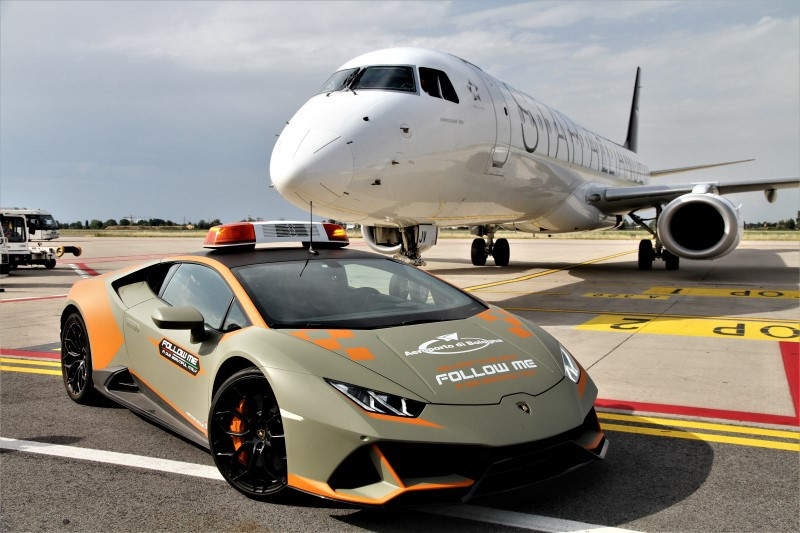

Generate config GenerationConfig {
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256
}

Generate config GenerationConfig {
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256
}



Our caption: a large plane is parked on the tarmac.
nlpconnect/vit-gpt2-image-captioning caption: a large jetliner sitting on top of an airport tarmac 
Abdou/vit-swin-base-224-gpt2-image-captioning caption: [unused31] æ [unused313] splits ں [unused279] [unused252] ↦matic [unused12]


In [106]:
show_image_and_captions("https://sv1.picz.in.th/images/2023/12/11/d0Di6MP.jpeg")

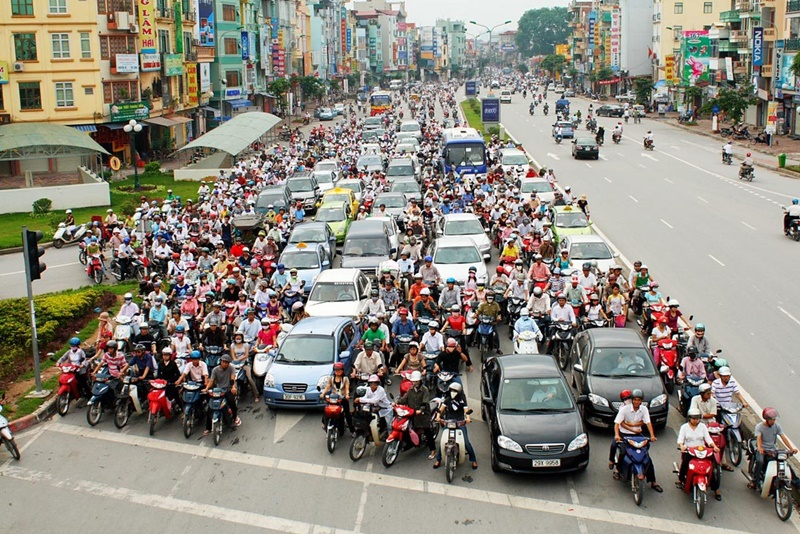

Generate config GenerationConfig {
  "bos_token_id": 50256,
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256
}

Generate config GenerationConfig {
  "decoder_start_token_id": 50256,
  "eos_token_id": 50256,
  "pad_token_id": 50256
}



Our caption: a group of people standing on a street.
nlpconnect/vit-gpt2-image-captioning caption: a busy street with cars and motorcycles 
Abdou/vit-swin-base-224-gpt2-image-captioning caption: [unused31] ↦ მ [unused281] [unused656] cruel [unused861] [unused252] counter [unused12]


In [107]:
show_image_and_captions("https://sv1.picz.in.th/images/2023/12/11/d0Di8De.jpeg")